<a href="https://colab.research.google.com/github/akpax/FelinePredictor/blob/main/feline_image_predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
! pip install fastbook
! pip install fastai

In [8]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [4]:
#hide
ims = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']

In [5]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

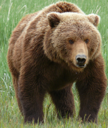

In [6]:
im = Image.open(dest)
im.to_thumb(128,128)

In [19]:
import os
key =  os.environ.get('AZUREKEY')
# print(key)

In [20]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [21]:
results = search_images_bing(key, 'tiger')
ims = results.attrgot('contentUrl')
len(ims)

150

In [24]:
cat_types = 'tiger','lion','cat'
path = Path('cats')

In [25]:
if not path.exists():
    path.mkdir()
    for o in cat_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [26]:
fns = get_image_files(path)
fns

(#415) [Path('cats/lion/934773f4-6a64-49c7-9464-201116f3cf3c.jpg'),Path('cats/lion/9d9ee32a-743c-4eca-a7df-3618d8467ce7.jpg'),Path('cats/lion/3131b78c-4570-4fca-beff-240a897c6127.jpg'),Path('cats/lion/82492b2d-b9b6-4278-b19a-d2228bf2990c.jpg'),Path('cats/lion/846f5f2b-89bc-4ac0-b3f5-f3528485c63c.jpg'),Path('cats/lion/5a0f91c1-8d92-4156-88e4-2b4756e7a3c7.jpg'),Path('cats/lion/8d02438e-e051-4499-aa88-27ef461ef3e8.jpg'),Path('cats/lion/6275f1d3-c865-4d5a-aa6f-5241d8c6154e.jpg'),Path('cats/lion/94ccd862-9925-45ea-bd45-945c3aa36e82.jpg'),Path('cats/lion/21ca7677-d399-46f6-9a36-e8996ed1b74e.jpg')...]

In [27]:
failed = verify_images(fns)
failed

(#7) [Path('cats/cat/bf527659-5401-4af2-b075-e5efc0930aef.jpg'),Path('cats/cat/a67ad974-d122-4d99-9071-b0e3cc73729a.jpg'),Path('cats/cat/768dba1b-9c73-4249-9de3-b3c49adf645e.jpg'),Path('cats/cat/b5ea9444-616a-4e63-a2e8-06c527521e94.jpg'),Path('cats/tiger/b678e58c-6445-4d7c-99dd-215f0e9b95ad.jpg'),Path('cats/tiger/7244c61a-16ff-494f-9fa9-4b719decddde.jpg'),Path('cats/tiger/f1091d87-6a69-4aa5-a5d1-1f353cf08371.jpg')]

In [28]:
failed.map(Path.unlink);

In [29]:
??verify_images

In [30]:
cats = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [31]:
dls = cats.dataloaders(path)

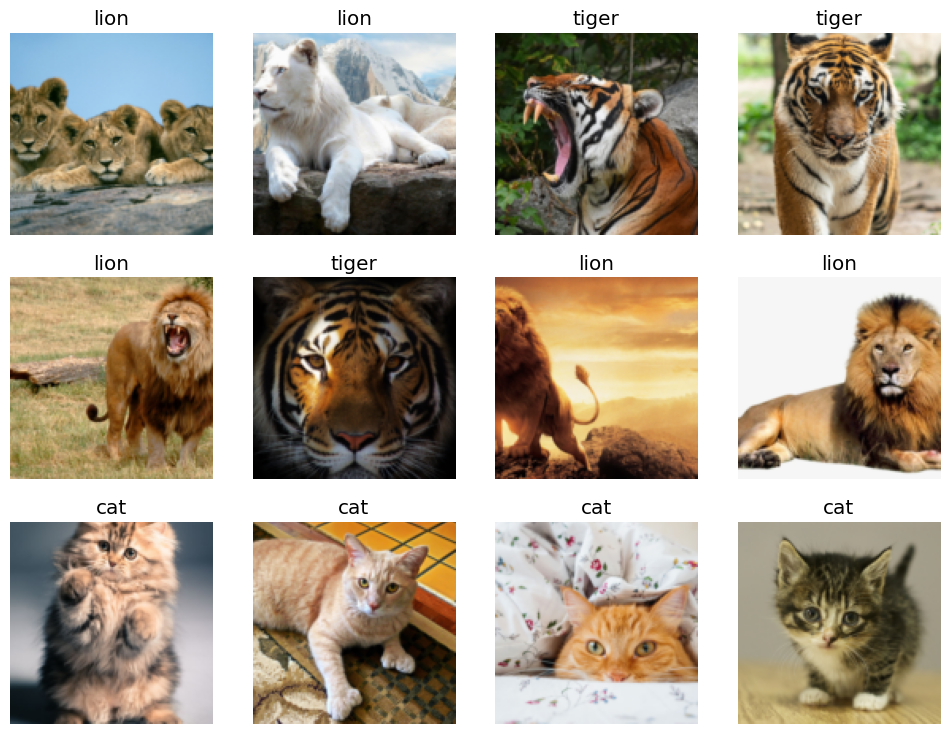

In [35]:
dls.valid.show_batch(max_n=12, nrows=3)

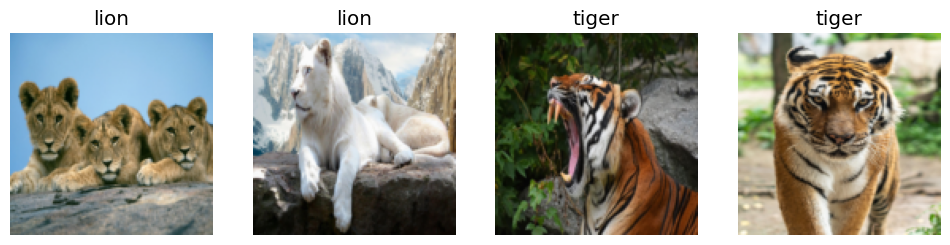

In [37]:
cats = cats.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = cats.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

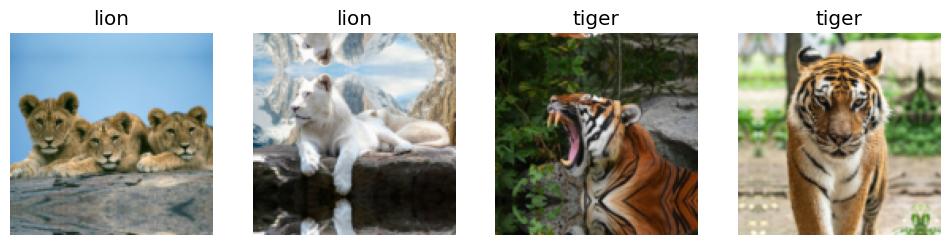

In [38]:
cats = cats.new(item_tfms=Resize(128, ResizeMethod.Pad))
dls = cats.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

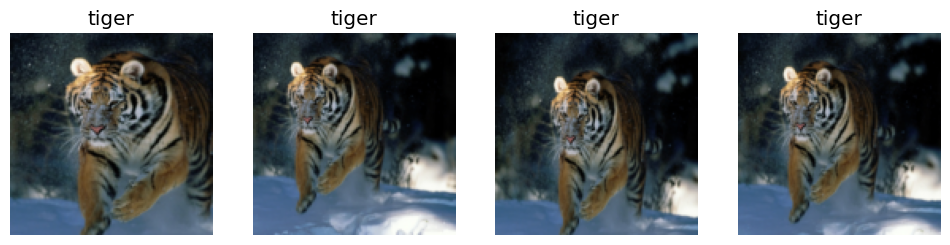

In [39]:
cats = cats.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = cats.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

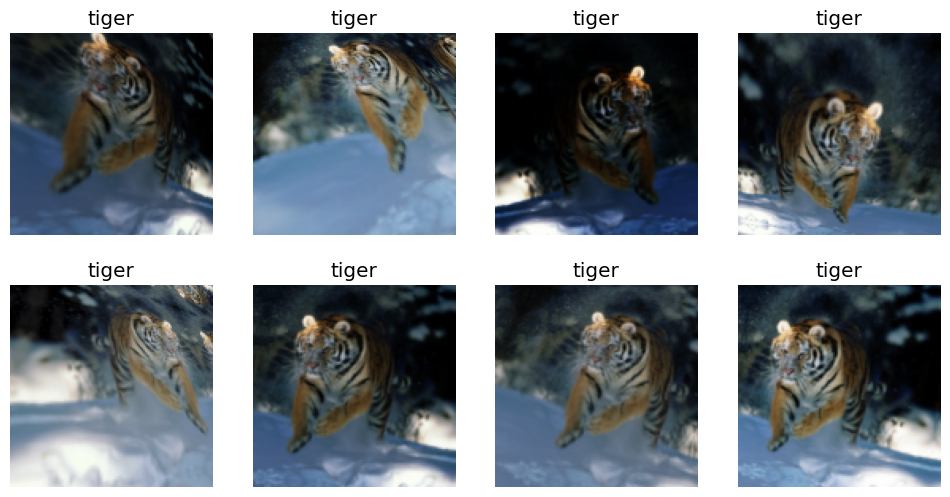

In [41]:
cats = cats.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = cats.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

Go Forward w Random Resize crop

In [42]:
cats = cats.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = cats.dataloaders(path)

In [43]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 161MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.354250,0.158256,0.061728,00:29


epoch,train_loss,valid_loss,error_rate,time
0,0.294837,0.057494,0.024691,00:17
1,0.191379,0.046618,0.012346,00:16
2,0.129452,0.052949,0.012346,00:16
3,0.106217,0.061117,0.012346,00:16


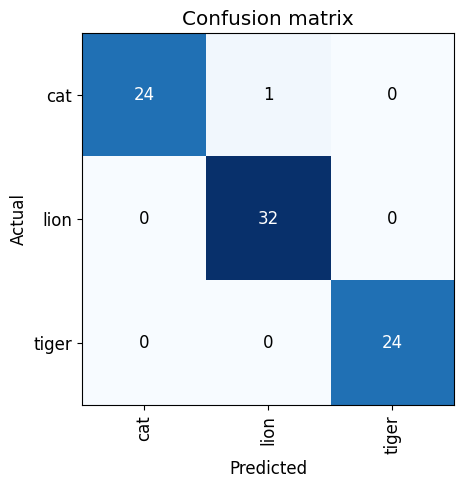

In [44]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

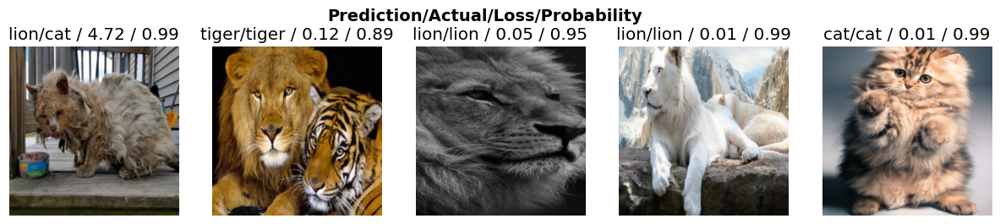

In [45]:
interp.plot_top_losses(5, nrows=1)

In [46]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [47]:
# unlink indices returned by cleaner
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [48]:
learn.export()

In [50]:
! ls

cats  drive  export.pkl  feline  images  sample_data


In [51]:
# test exprted learner
learn_inf = load_learner(path/'export.pkl')

In [53]:
learn_inf.predict("/content/cats/tiger/0361e155-346d-4d34-8597-1d010c7ce586.jpg")

('tiger', tensor(2), tensor([4.2572e-03, 7.1411e-04, 9.9503e-01]))

In [54]:
learn_inf.dls.vocab

['cat', 'lion', 'tiger']

## Create Notebook APP from Model

In [55]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [61]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [57]:
img = PILImage.create(btn_upload.data[-1])

In [58]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [59]:
pred,pred_idx,probs = learn_inf.predict(img)

In [60]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: lion; Probability: 1.0000')

In [62]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [63]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [64]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [66]:
#hide_output
VBox([widgets.Label('Select your feline (cat/lion/tiger)!'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [67]:
#hide
!pip install voila
!jupyter serverextension enable --sys-prefix voila

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.9/105.9 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.3/380.3 kB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 34.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 9.5 MB/s eta 0:00:00
  Attempting uninstall: pyzmq
    Found existing installation: pyzmq 23.2.1
    Uninstalling pyzmq-23.2.1:
      Successfully uninstalled pyzmq-23.2.1
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting u

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.5.5 OK
